In [1]:
import timit_stats as ts
gestures_scaled = ts.load_obj("scaled_gestures")

Corpus parsed
Gestures scaled


Populating the interactive namespace from numpy and matplotlib
d


`%matplotlib` prevents importing * from pylab and numpy


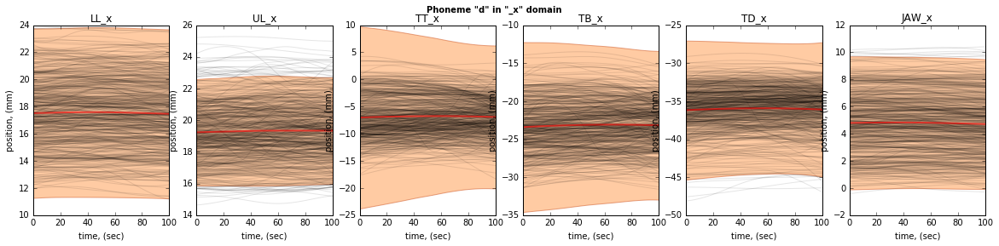

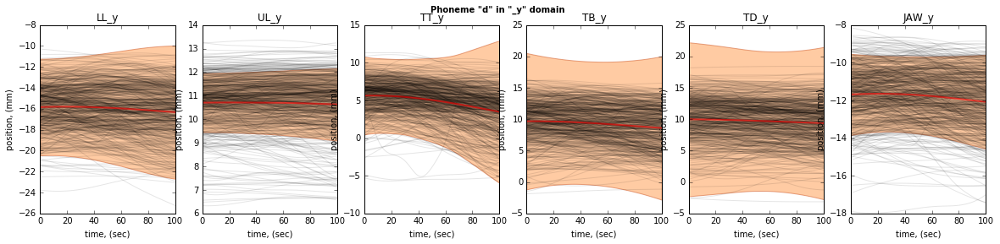

t


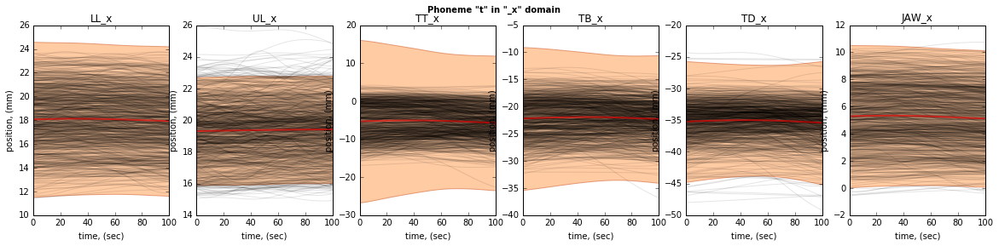

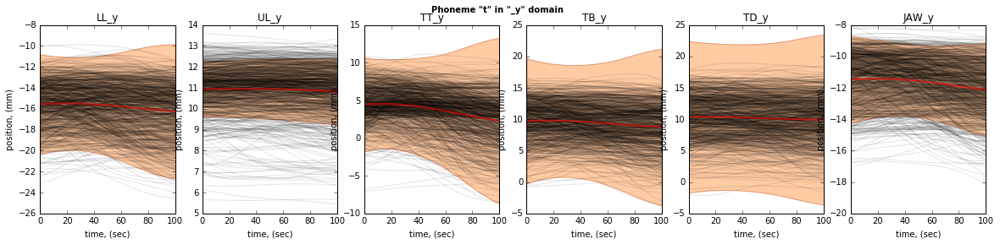

b


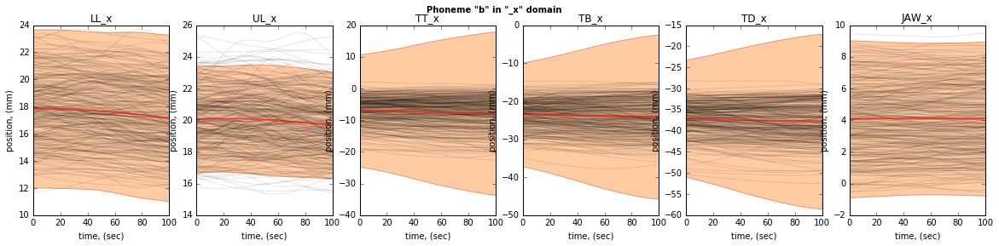

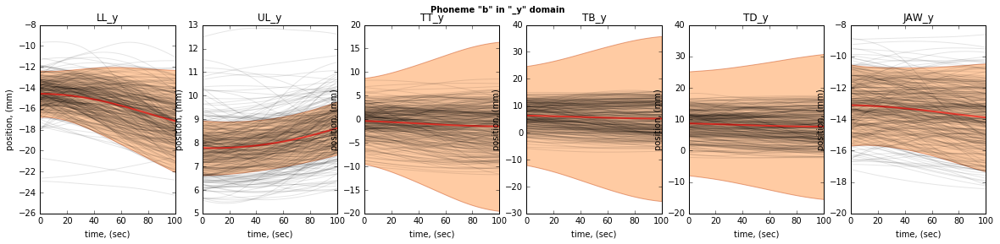

p


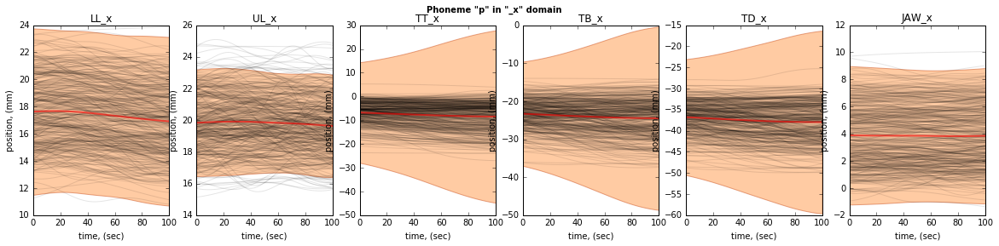

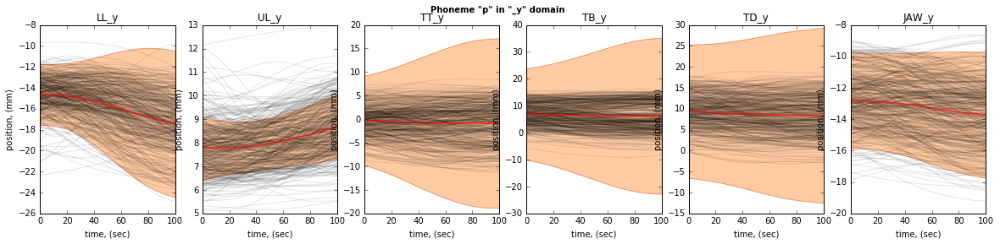

z


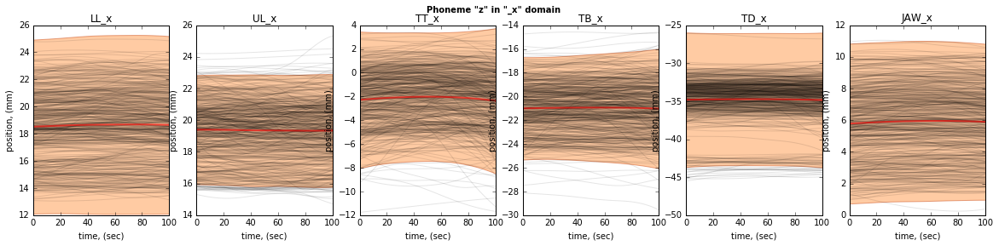

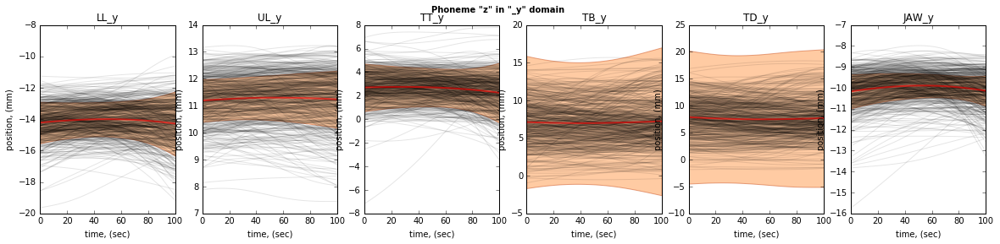

s


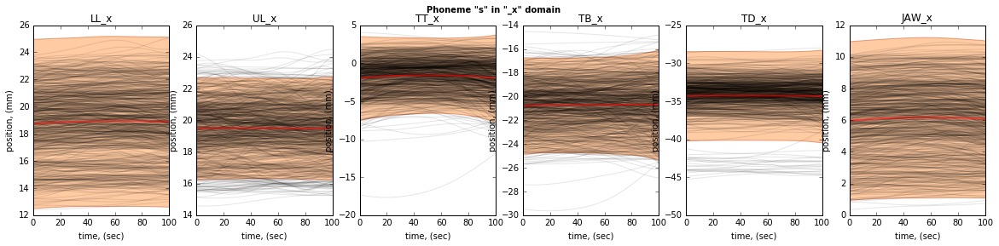

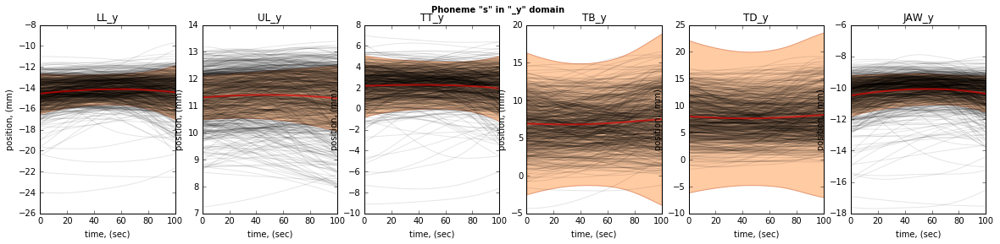

dh


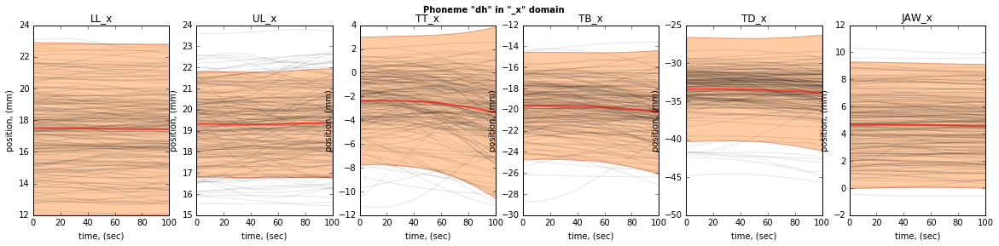

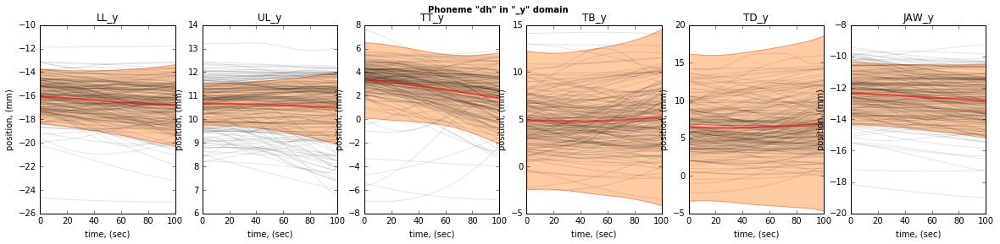

th


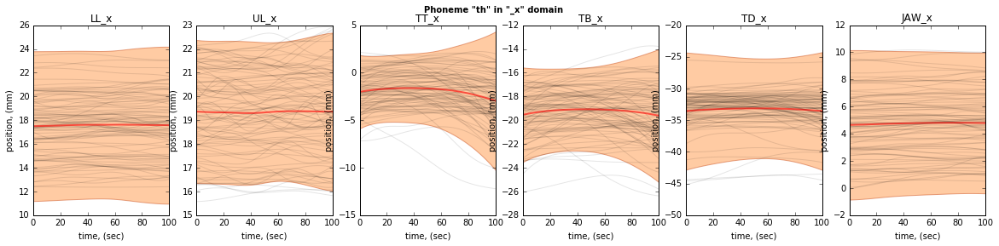

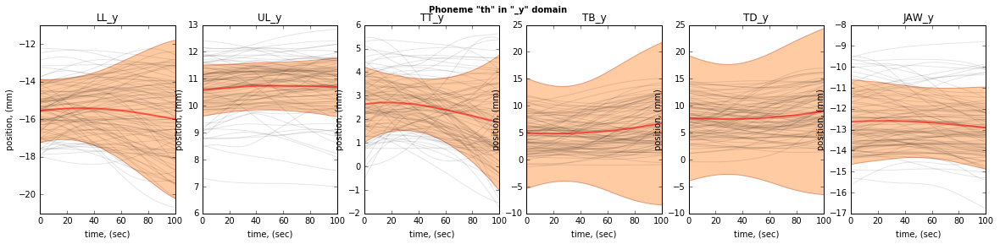

g


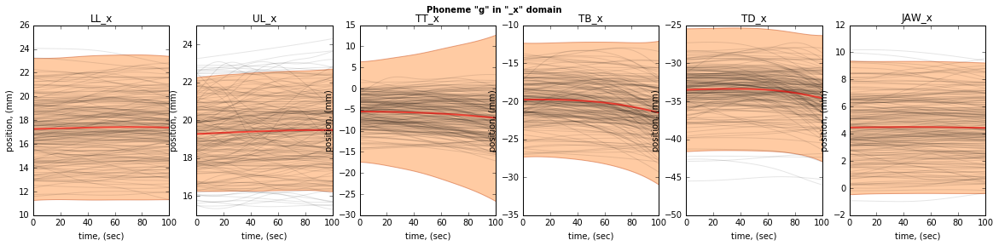

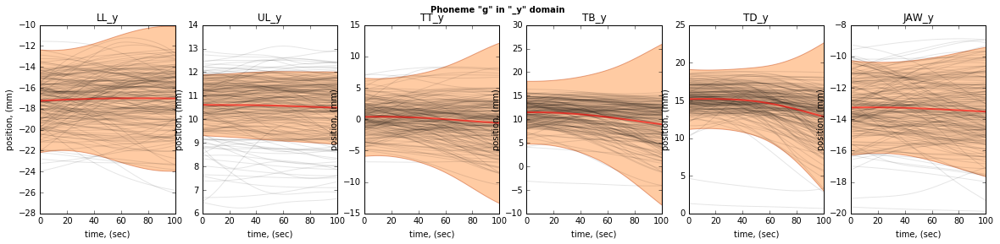

k


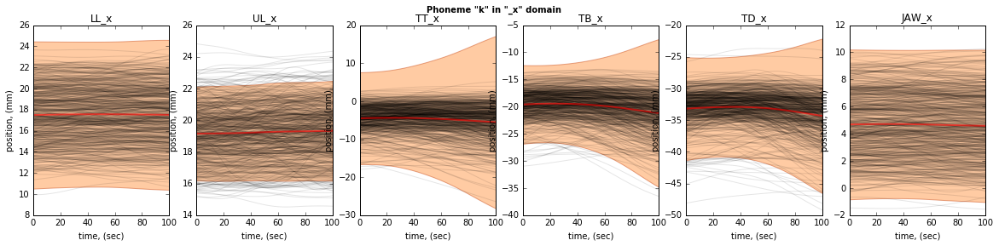

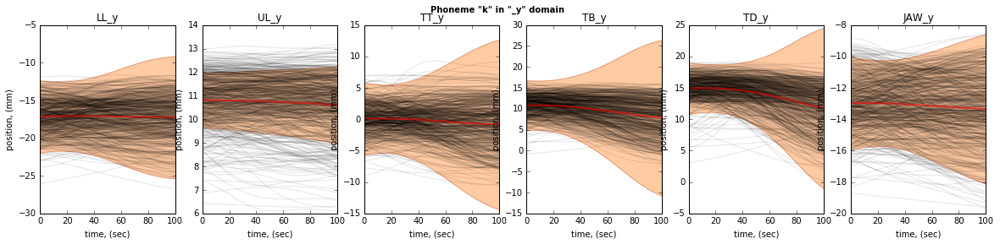

l


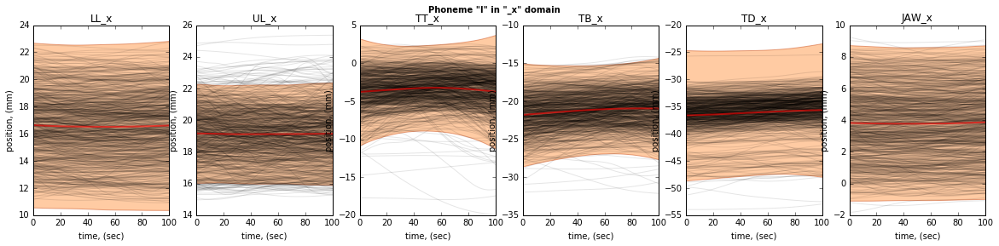

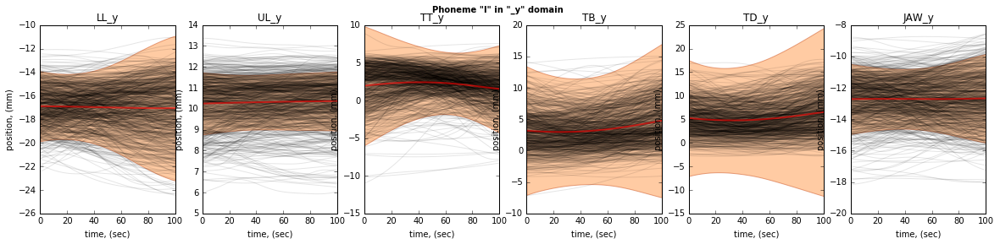

m


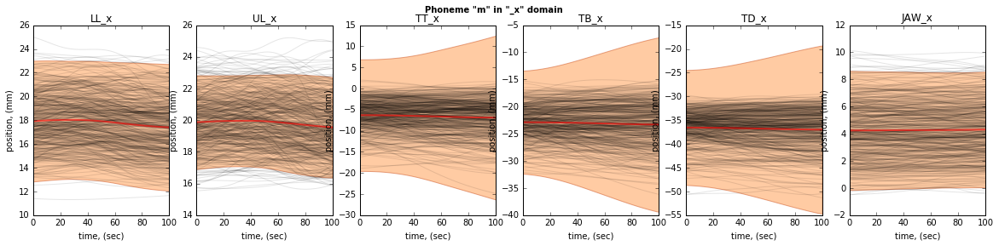

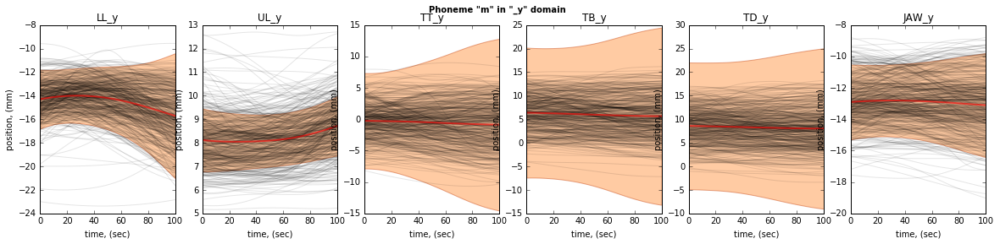

n


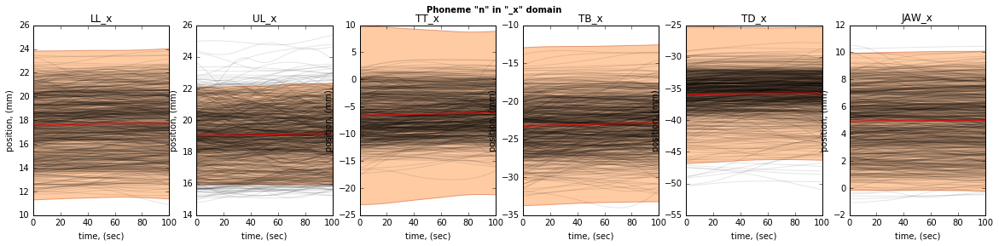

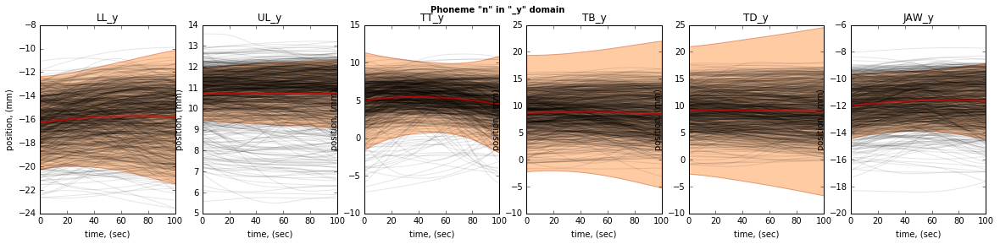

r


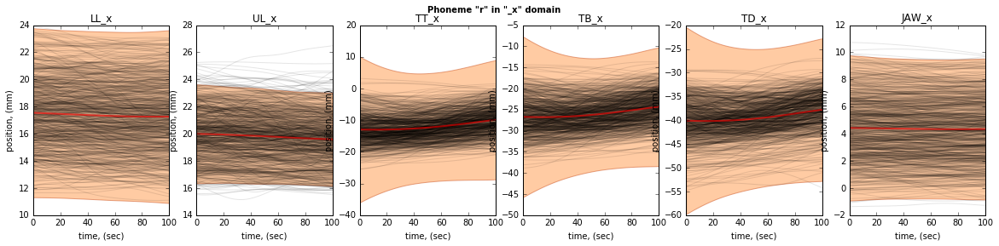

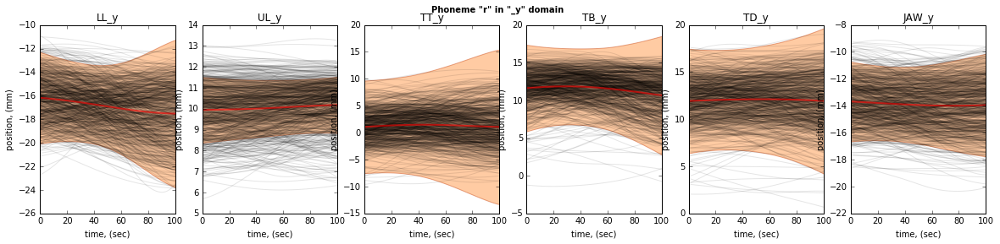

In [9]:
import gesture as ges
import os
import matplotlib.pyplot as plt

%pylab inline

articulators = ["LL", "UL", "TT", "TB", "TD", "JAW"]
domains = ["_x", "_y"]
num_scaled = 100

consonant_gestures = ["d", "t", "b", "p", "z", "s", "dh", "th", "g", "k", "l", "m", "n", "r"]

mean_scaled_dict = {}
variance_scaled_dict = {}

for g in consonant_gestures:
    phonemes = gestures_scaled[g].phonemes
    
    mean_scaled_dict[g] = {}
    variance_scaled_dict[g] = {}
    
    print g
    for d in domains:
        fig1, ax = plt.subplots(1, len(articulators), figsize=(20, 4))
        
        fig1.suptitle("Phoneme \"{}\" in \"{}\" domain".format(g, d), 
                      fontsize=10, fontweight='bold')
        for i in range(len(articulators)): 
            ax[i].grid(color='black', linestyle='-', linewidth=1, alpha=0.3, axis='xy')
            ax[i].set_xlabel("time, (sec)")
            ax[i].set_ylabel("position, (mm)")
            ax[i].legend(loc='lower left')
            ax[i].title.set_text(articulators[i]+d)
            t = np.linspace(0, num_scaled, num_scaled)
            mean = [0.0]*num_scaled
            variance = [0.0]*num_scaled
            skipped = 0
            for phoneme in phonemes:
                ax[i].plot(t, phoneme.params[articulators[i]+d], color="black", linewidth=1, alpha=0.1)
                if any([math.isnan(v) for v in phoneme.params[articulators[i]+d]]):
                    skipped += 1
                    continue
                mean = [mean[j] +  phoneme.params[articulators[i]+d][j] for 
                        j in range(len(phoneme.params[articulators[i]+d]))]
                variance = [variance[j] +  phoneme.params[articulators[i]+d][j]**2 for 
                        j in range(len(phoneme.params[articulators[i]+d]))]
            mean = [mean[j]/(len(phonemes) - skipped) for j in range(len(mean))]
            variance = [variance[j]/(len(phonemes) - skipped) for j in range(len(variance))]
            variance = [(variance[j] - mean[j]**2)*1.0 for j in range(len(variance))]
            mean_upper = [mean[j]+variance[j] for j in range(len(mean))]
            mean_lower = [mean[j]-variance[j] for j in range(len(mean))]
            
            mean_scaled_dict[g][articulators[i]+d] = mean
            variance_scaled_dict[g][articulators[i]+d] = variance
            ax[i].plot(t, mean, color="red", linewidth=2, alpha=0.6)
            ax[i].fill_between(t, mean_lower, mean_upper,
    alpha=0.5, edgecolor='#CC4F1B', facecolor='#FF9848')
        plt.show()
    

        
    
    

In [10]:
import gesture as ges

gestures = ts.load_obj("gestures")


51


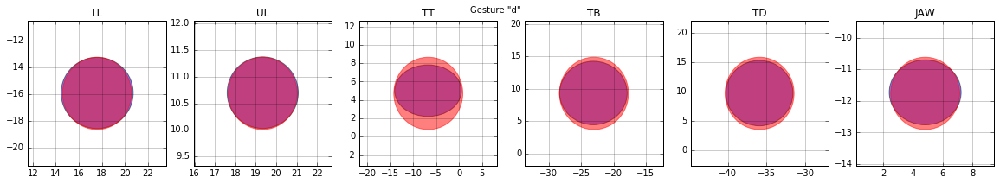

42


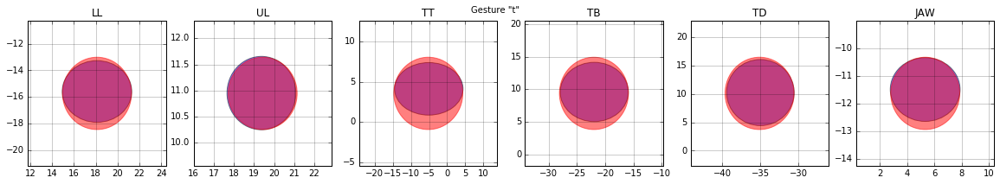

0


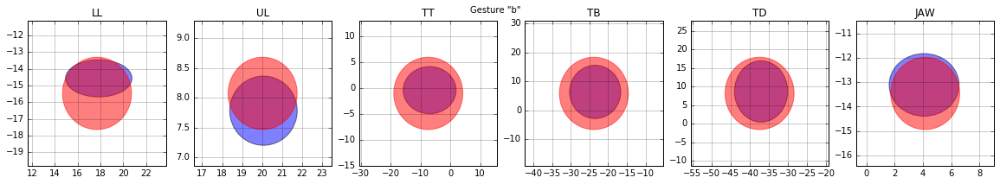

0


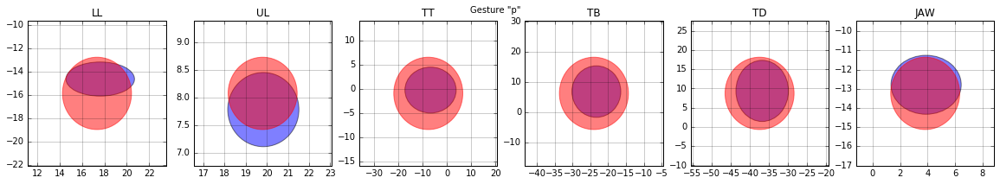

34


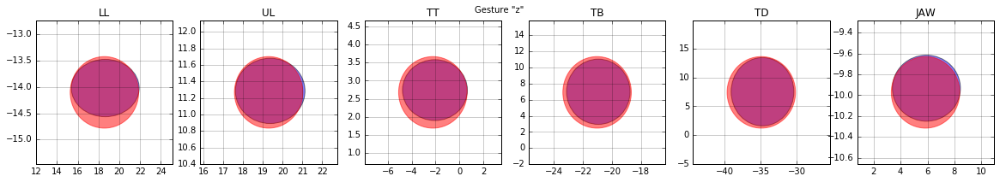

45


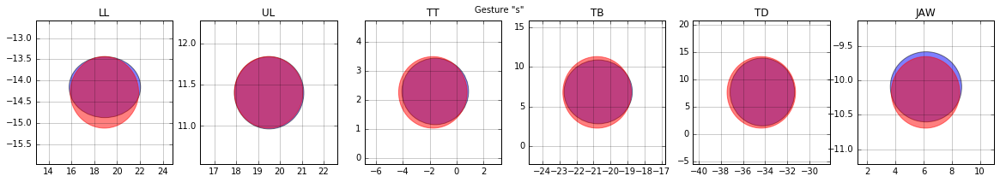

16


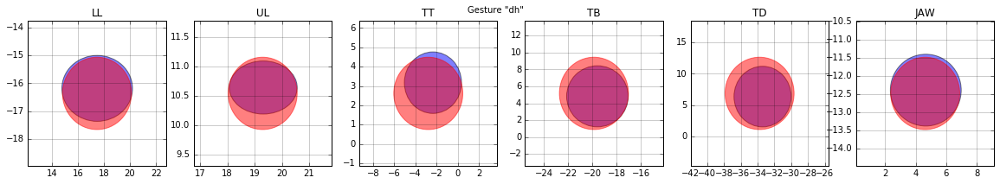

30


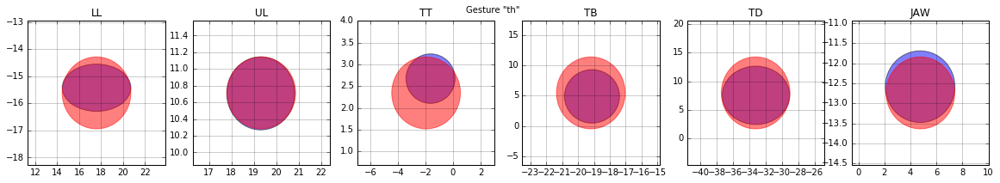

6


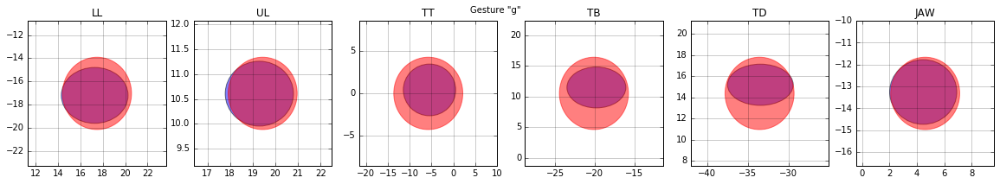

13


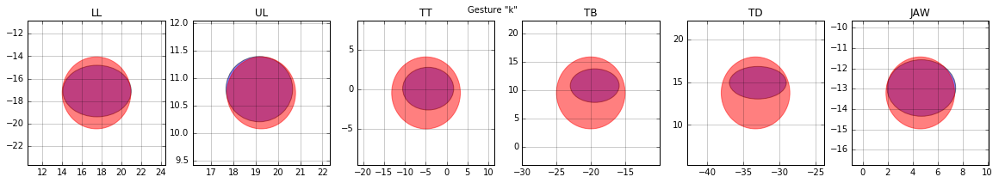

39


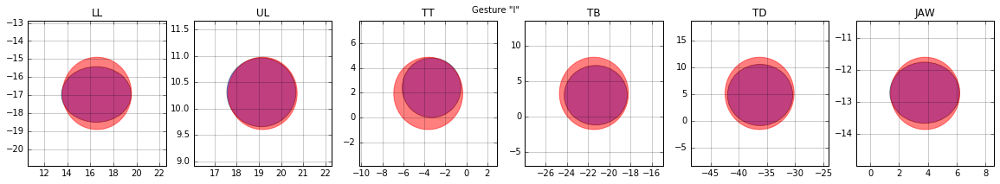

4


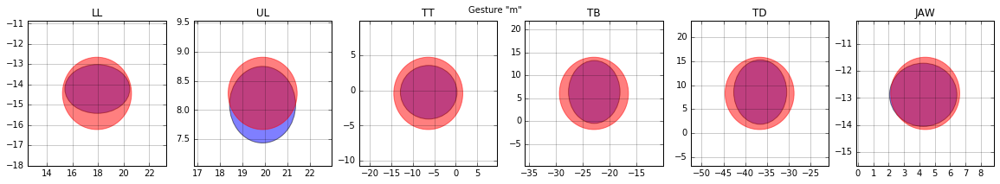

27


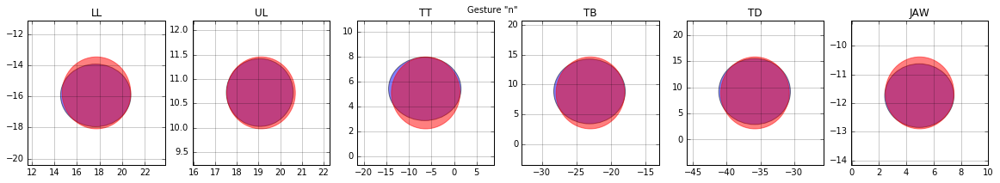

45


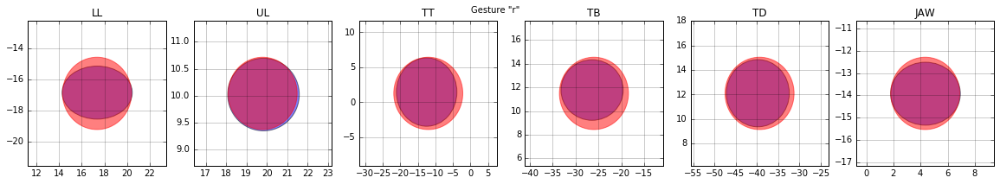

In [11]:
from matplotlib.patches import Ellipse

mean_dict = {}
variance_dict = {}

mean = {}
variance = {}

for g in consonant_gestures:
    mean[g] = {}
    variance[g] = {}
    
    mean_dict[g] = gestures[g].get_mean()
    
    variance_dict[g] = gestures[g].get_variance()
    
#     calc target for scaled gestures and their mean and variance
    params = variance_scaled_dict[g].keys()
    sum_variance = np.array([0.0]*num_scaled)
    for p in params:
        sum_variance = sum_variance + np.array(variance_scaled_dict[g][p])
    index = np.argmin(sum_variance)
    print index
    fig1, ax = plt.subplots(1, len(articulators), figsize=(20, 3))
    fig1.suptitle("Gesture \"{}\"".format(g, fontsize=20, fontweight='bold'))
    i = 0
    for a in articulators:
        for d in domains:
            mean[g][a+d] = mean_scaled_dict[g][a+d][index]
            variance[g][a+d] = variance_scaled_dict[g][a+d][index]
        
#             plot old and new means with variances

        ax[i].grid(color='black', linestyle='-', linewidth=1, alpha=0.2)
       
        ax[i].title.set_text(a)
#         a = articulators[i]
#         plot mean ellipse
        e = Ellipse(xy=[mean[g][a+"_x"], mean[g][a+"_y"]],
                    width=variance[g][a+"_x"], height=variance[g][a+"_y"], alpha=0.5)
        ax[i].add_artist(e)
                  
        e_old = Ellipse(xy=[mean_dict[g][a+"_x"], mean_dict[g][a+"_y"]],
                    width=variance_dict[g][a+"_x"], height=variance_dict[g][a+"_y"], alpha=0.5, color="red")
        ax[i].add_artist(e_old)
        
        ax[i].set_xlim(mean_dict[g][a+"_x"] - variance_dict[g][a+"_x"], mean_dict[g][a+"_x"] + variance_dict[g][a+"_x"])
        ax[i].set_ylim(mean_dict[g][a+"_y"] - variance_dict[g][a+"_y"], mean_dict[g][a+"_y"] + variance_dict[g][a+"_y"])
        ax[i].legend(loc='lower left')
#         ax[i].autoscale()
        i += 1
    plt.show()
        